## Comments
in general,We could observe that in the range [12,63] of the feature max distance, the higher percentages belong to no churn clients.Something that interested us is that for the more recent time period between 1 to 10 days the percentage of churners is higher than the respective one of no churn clients.  

In [31]:
#assess the results ( the prcentage of churn clients that have max distance = 56)
print((len(churn.loc[churn['max_dist'] == 56])/len(churn))*100)

0.6384826353964278


In [32]:
#assess the results ( the prcentage of not_churn clients that have max distance = 31)
print((len(not_churn.loc[not_churn['max_dist'] == 31])/len(not_churn))*100)

2.287653448901277


In [33]:
#apply the function
column='recency'
hist2=histogram(column)


### Comments
As it is normal for the churn clients the last time entering to the system NBG is much more than the respective one for the non churn clients. 

#### We do not want to have column with the clients' usernamemes, so we drop this column

In [34]:
data_classification.drop(['client_username_s'], axis=1, inplace=True)

In [35]:
data_classification.head()

,countt,recency,frequency,max_dist,average_trans_dur,diff_maxd_mind_days,start_trans_end_data,Cluster,Target_by_med
0,7128.0,0.0,213.0,6.0,1.25,266.0,266.0,0,0
1,437.0,7.0,26.0,98.0,15.00,390.0,397.0,0,1
2,2780.0,6.0,136.0,27.0,5.29,720.0,726.0,0,0
3,2050.0,1.0,154.0,31.0,4.69,723.0,724.0,0,0
4,1786.0,2.0,40.0,29.0,9.90,396.0,398.0,0,0


# Correlation matrix-interactive

In [56]:
#correlation
correlation = data_classification.corr()
#tick labels
matrix_cols = correlation.columns.tolist()
#convert to array
corr_array  = np.array(correlation)

#Plotting
trace = go.Heatmap(z = corr_array,
                   x = matrix_cols,
                   y = matrix_cols,
                   colorscale = "Viridis",
                   colorbar   = dict(title = "Pearson Correlation coefficient",
                                     titleside = "right"
                                    ) ,
                  )

layout = go.Layout(dict(title = "Correlation Matrix for variables in all dataset",
                        autosize = False,
                        height  = 720,
                        width   = 800,
                        margin  = dict(r = 0 ,l = 210,
                                       t = 25,b = 210,
                                      ),
                        yaxis   = dict(tickfont = dict(size = 9)),
                        xaxis   = dict(tickfont = dict(size = 9))
                       )
                  )

data = [trace]
fig = go.Figure(data=data,layout=layout)
py.iplot(fig)

# CLUSTER 0

In [37]:
data_classification_cl0['Target_by_med'].value_counts()

0    555895
1     38583
Name: Target_by_med, dtype: int64

In [38]:
print('The no churn clients are '+str(data_classification_cl0['Target_by_med'].value_counts()[0]) +' whereas \nthe churn clients are ' + str(data_classification_cl0['Target_by_med'].value_counts()[1]))


The no churn clients are 555895 whereas 
the churn clients are 38583


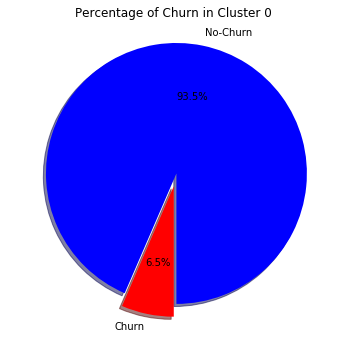

In [57]:
# Data to plot
labels='No-Churn','Churn'
explode = (0.1, 0) #0.1 means that we want to be cut off the clice
sizes = data_classification_cl0['Target_by_med'].value_counts(sort = True)
colors = ["blue","red"] 
rcParams['figure.figsize'] = 6,6
# Plot
plt.pie(sizes, explode=explode, labels=labels, colors=colors,
        autopct='%1.1f%%', shadow=True, startangle=270,)
plt.title('Percentage of Churn in Cluster 0')
plt.show()

In [40]:
print ("Rows     : " ,data_classification_cl0.shape[0])
print ("Columns  : " ,data_classification_cl0.shape[1])
print ("\nFeatures : \n" ,data_classification_cl0.columns.tolist())
print ("\nMissing values :  ", data_classification_cl0.isnull().sum().values.sum())
print ("\nUnique values :  \n",data_classification_cl0.nunique())

Rows     :  594478
Columns  :  10

Features : 
 ['client_username_s', 'countt', 'recency', 'frequency', 'max_dist', 'average_trans_dur', 'diff_maxd_mind_days', 'start_trans_end_data', 'Cluster', 'Target_by_med']

Missing values :   0

Unique values :  
 client_username_s       594478
countt                    8220
recency                    410
frequency                  356
max_dist                   393
average_trans_dur         2453
diff_maxd_mind_days        644
start_trans_end_data       512
Cluster                      1
Target_by_med                2
dtype: int64


## Summary (interactive)

In [58]:
summary = (data_classification_cl0.
           describe().transpose().reset_index())

summary = summary.rename(columns = {"index" : "feature"})
summary = np.around(summary,3)

val_lst = [summary['feature'], summary['count'],
           summary['mean'],summary['std'],
           summary['min'], summary['25%'],
           summary['50%'], summary['75%'], summary['max']]

trace  = go.Table(header = dict(values = summary.columns.tolist(),
                                line = dict(color = ['#506784']),
                                fill = dict(color = ['#119DFF']),
                               ),
                  cells  = dict(values = val_lst,
                                line = dict(color = ['#506784']),
                                fill = dict(color = ["lightgrey",'#F5F8FF'])
                               ),
                  columnwidth = [200,60,100,100,60,60,80,80,80])
layout = go.Layout(dict(title = "Summary Table for all variabls-features in Cluster 0"))
figure = go.Figure(data=[trace],layout=layout)
py.iplot(figure)